# Исследование рынка общепита в Москве

Мы с партнерами решили открыть небольшое кафе в Москве. Оно оригинальное — гостей должны обслуживать роботы. Проект многообещающий, но дорогой. Поэтому было решено обратиться к инвесторам. Их интересует текущее положение дел на рынке — сможем ли мы снискать популярность на долгое время, когда все зеваки насмотрятся на роботов-официантов?
Поэтому необходимо подготовить исследование рынка на основе открытых данных о заведениях общественного питания в Москве.


## Изучение данных из файла, подготовка к анализу

In [1]:
# Импортируем нужные библиотеки
import pandas as pd
import numpy as np
import datetime as dt
from matplotlib import pyplot as plt
from pandas import option_context
import scipy.stats as stats
import seaborn as sns
import plotly.express as px

In [2]:
# читаем файл и сохраняем его в переменной df
df = pd.read_csv('/datasets/rest_data.csv')
# выведем на экран первые 20 строк таблицы
display(df.head(20))

,id,object_name,chain,object_type,address,number
0,151635,СМЕТАНА,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48
1,77874,Родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35
2,24309,Кафе «Академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95
3,21894,ПИЦЦЕТОРИЯ,да,кафе,"город Москва, Абрамцевская улица, дом 1",40
4,119365,Кафе «Вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50
5,27429,СТОЛ. ПРИ ГОУ СОШ № 1051,нет,столовая,"город Москва, Абрамцевская улица, дом 15, корп...",240
6,148815,Брусника,да,кафе,"город Москва, переулок Сивцев Вражек, дом 6/2",10
7,20957,Буфет МТУСИ,нет,столовая,"город Москва, Авиамоторная улица, дом 8, строе...",90
8,20958,КПФ СЕМЬЯ-1,нет,столовая,"город Москва, Авиамоторная улица, дом 8, строе...",150
9,28858,Столовая МТУСИ,нет,столовая,"город Москва, Авиамоторная улица, дом 8, строе...",120


In [3]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15366 entries, 0 to 15365
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           15366 non-null  int64 
 1   object_name  15366 non-null  object
 2   chain        15366 non-null  object
 3   object_type  15366 non-null  object
 4   address      15366 non-null  object
 5   number       15366 non-null  int64 
dtypes: int64(2), object(4)
memory usage: 720.4+ KB
None


In [4]:
# проверим пропуски
df.isna().mean()*100

id             0.0
object_name    0.0
chain          0.0
object_type    0.0
address        0.0
number         0.0
dtype: float64

Убедились, что пропуски в таблице отсутствуют. Также по информации о файле видим, что все данные имеют верный тип данных. Проверим дубликаты

In [5]:
print ('Дубликатов в таблице:', df.duplicated().sum())

Дубликатов в таблице: 0


Т.е. полностью дублирующие строки отсутствуют. Посмотрим на уникальные значения в столбце object_name, возможно наличие неявных дубликатов.

In [6]:
# приведем все названия к нижнему регистру
df['object_name'] = df['object_name'].str.lower()

In [7]:
pd.set_option('display.max_rows', None)
df['object_name'].value_counts()

столовая                                                                                                321
кафе                                                                                                    278
шаурма                                                                                                  250
шоколадница                                                                                             158
kfc                                                                                                     155
макдоналдс                                                                                              151
бургер кинг                                                                                             137
теремок                                                                                                  94
домино'с пицца                                                                                           90
крошка картошка             

Видим, что в столбце object_name очень много неявных дубликатов. Например, "Шоколадница" в нескольких вариантах (шоколадница, кафе «шоколадница», кофейня «шоколадница» и т.д) То же и с другими сетевыми заведениями (kfc, макдоналдс, бургер кинг, теремок, доминос, крошка картошка, папа джонс, додо пицца, якитория, кофе хаус, иль патио и т.д.). Приведем их к единообразию 

In [8]:
def new_name(row): 
    if row in ['кафе «шоколадница»', 'кофейня «шоколадница»', 'кофейня шоколадница', 'шоколадница кофе хаус']: 
        return 'шоколадница'
    if row in ['алло-пицца', 'пиццерия «алло пицца»', 'алло пицца 2']: 
        return 'алло пицца' 
    if row in ['ресторан «тануки»', 'ресторан тануки']: 
        return 'тануки' 
    if row in ['му му', 'кафе «му-му»', 'кафе быстрого питания му-му', 'кафе му-му', 'кафе «му му»']: 
        return 'му-му' 
    if row in ['ресторан «теремок»', 'кафе «теремок»', 'кафе теремок', 'предприятие быстрого обслуживания «теремок»']: 
        return 'теремок' 
    if row in ['паб кружка', 'кафе «кружка»']: 
        return 'кружка' 
    if row in ['ресторан «макдоналдс»', 'предприятие быстрого обслуживания «макдоналдс»', 'кафе «макдоналдс»', 'кафе макдоналдс']: 
        return 'макдоналдс'
    if row in ['kfc волгоградский', 'kfc', 'kfc.', 'кафе «kfc»', 'ростикс kfc', 'ресторан «kfc»', 'предприятие быстрого обслуживания «kfc»', 'закусочная kfc', 'пбо «kfc»', 'ресторан кфс']:   
        return 'кфс' 
    if row in ['кафе якитория', 'ресторан «якитория»', 'кафе «якитория»']:
        return 'якитория' 
    if row in ['кофе хаус', 'кофе-хаус', 'кофейня «кофе хаус»']: 
        return 'кофехаус' 
    if row in ['братья караваевых', 'кафе «кулинарная лавка братьев караваевых»', '«кафе «кулинарная лавка братьев караваевых»', 'кулинарная лавка братьев караваевых', 'кулинарная лавка братьев караваевых братья караваевы']:    
        return 'братья караваевы' 
    if row in ['прайм стар', 'прайм-кафе', 'prime прайм стар', 'кафе «prime» прайм стар', 'кафе prime прайм стар прайм-кафе', 'prime прайм стар прайм-кафе', 'праймстар']:
        return 'прайм' 
    if row in ['додопицца', 'пиццерия «додо пицца»', 'пицца «додо»', 'предприятие быстрого обслуживания «додо пицца»']:
        return 'додо пицца' 
    if row in ['кафе «крошка картошка»', 'ресторан быстрого питания «крошка картошка»', 'крошкакартошка']:
        return 'крошка картошка' 
    if row in ['il patio', 'иль патио планета суши', 'ресторан «иль патио»', 'иль-патио il патио', 'кафе «иль патио»', 'il патиопланета суши', 'кафе иль патио «il patio»']:  
        return 'иль патио' 
    if row in ['мята lounge', 'кальянная мята lounge', 'мята лаунж', 'мята lounge автозаводская', 'лаундж-бар «мята lounge»', 'кальян-бар мята lounge', 'кальянная «мята lounge»', 'мята lounge октябрьская', 'кальян-бар «мята lounge»', 'кальянная «мята launge»', 'мята кальянная', 'мята lounge шаболовка']:  
        return 'мята' 
    if row in ['кафе «старбакс»', 'старбакс starbucks', 'кафе «сабвей» старбакс', 'starbucks', 'старбакс кофе', 'старбакс кофе', 'кофейня «старбакс»']:                                                                                  
        return 'старбакс' 
    if row in ['pizza hut', 'кафе «пицца хат»', 'пиццерия «пицца хат»']:
        return 'пицца хат' 
    if row in ['дабл би-кофейня', 'даблби', 'кофейня «даблби»', 'кафе даблби', 'кафе «даблби»', 'кофейня «дабл би»', 'дабл би блэк']:   
        return 'дабл би' 
    if row in ['бургер кинг burger king', 'предприятие быстрого обслуживания «бургер кинг»', 'кафе «бургер кинг»', 'закусочная «бургер кинг»', 'кафе-закусочная «бургер кинг»', 'кафе бургер кинг', 'ресторан «бургер кинг»']: 
        return 'бургер кинг' 
    if row in ['кондитерская-пекарня волконский', 'кафе «волконский»', 'кафе-пекарея «волконский»', 'кондитерская волконский', 'кафе волконский', 'пекарня пекарня волконский']: 
        return 'волконский' 
    if row == 'кафе лукойл': 
        return 'лукойл' 
    if row in ['стардогs', 'закусочная «стардогs»']:
        return 'стардогс' 
    if row in ['кафе «баскин роббинс»', 'baskin robbins']:  
        return 'баскин роббинс' 
    if row in ['магазин готовой еды «милти»', 'предприятие быстрого обслуживания «милти»', 'точка продажи готовой еды милти', 'готовые блюда милти', 'милти готовые блюда для здорового питания']: 
        return 'милти' 
    if row == 'van wok ванвок':
        return 'ванвок'
    if row in ['пиццерия «папа джонс»', 'кафе «папа джонс»', 'пиццерия папа джонс', 'папа джонс пицца']: 
        return 'папа джонс'
    if row in ['бар «суши wok»', 'сушивок', 'суши wok', 'сушиwok']:
        return 'суши вок'
    if row in ['subway', 'сабвэй']:
        return 'сабвей'
    if row == 'coffeeshop company':
        return 'coffeeshop'
    if row == 'domino-s pizza':
        return 'dominos pizza'
    if row in ['krispy krem', 'krispy kreme']:
        return 'krispy creme'
    else:
        return row
        
df['object_name'] = df['object_name'].apply(new_name)


Теперь изучим столбец chain

In [9]:
display(df.groupby(['object_name', 'chain']).agg({'chain':['count']}))


,,chain
,,count
object_name,chain,
1-й мок,нет,1
1-ый московский кадетский корпус,нет,1
100 личная столовая,нет,1
100 личное кафе,нет,1
1001 ночь,нет,1
100лоффка,нет,1
101 вкус,нет,1
13 rules,нет,2


Видим, что очень многие сети (напр., мята ,милти, кфс и.д.) имеют двойной статус (и "сеть" и "не сеть"), поэтому необходимо будет заменить "нет" на "да". Не будем смотреть предприятия с общими наименованиями (кафе, бистро, бар и.т.д.). Кроме того, логично, что если предприятие имеет 2 и более точки, то это уже сеть. В то же время, это могут быть разные франшизы, поэтому в этом случае не будем ничего заменять.

In [10]:
chain_places = ['dominos pizza','cinnabon','дабл би','farш','fridays', 'кфс','милти','мята','бургер кинг','додо пицца', 'иль патио','гриль хаус','волконский','виктория', 'азбука вкуса','алло пицца','krispy creme','баскин роббинс']

df.loc[df['object_name'].isin(chain_places), 'chain'] = 'да'

In [11]:
# Теперь посмотрим дубликаты
sum(df[['object_name', 'object_type', 'address', 'number']].duplicated())

85

In [12]:
# Удалим дубликаты
df = df.drop_duplicates(subset=['object_name', 'object_type', 'address', 'number'])
print(df.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 15281 entries, 0 to 15365
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           15281 non-null  int64 
 1   object_name  15281 non-null  object
 2   chain        15281 non-null  object
 3   object_type  15281 non-null  object
 4   address      15281 non-null  object
 5   number       15281 non-null  int64 
dtypes: int64(2), object(4)
memory usage: 835.7+ KB
None


Что касается столбца object_type тут тоже есть некоторые особенности. Например, одно предприятие сети имеет статус "кафе", другое - "ресторан". Предположим, такое возможно, и не будем ничего с этим делать. 
Теперь посмотрим на статистику по количеству посадочных мест. 

In [13]:
df.number.describe()

count    15281.000000
mean        59.788234
std         74.843042
min          0.000000
25%         14.000000
50%         40.000000
75%         80.000000
max       1700.000000
Name: number, dtype: float64

Максимальное количество посадочных мест 1700, слишком много. Но все-таки для Москвы такое большое количество мест вполне может быть. А вот отсутствие посадочных мест рассмотрим более подробно

In [14]:
df0 = df.query('number == 0')
df0['object_type'].value_counts()

предприятие быстрого обслуживания    690
кафе                                 306
закусочная                           181
магазин (отдел кулинарии)            145
кафетерий                            111
буфет                                 64
ресторан                              44
бар                                   28
столовая                              19
Name: object_type, dtype: int64

Видим, что заведением с отсутствием посадочных мест довольно много. В таких заведениях, как предприятие быстрого обслуживания, закусочная, буфет, бар, это даже правильно, там по определению нет посадочных мест. Для заведений других видов это также вполне допустимо, возможно, они работают "на вынос" или только на доставку. Поэтому не будем с нулями ничего делать. Перейдем непосредственно к анализу.

## Соотношение видов объектов общепита по количеству

Сначала сгруппируем данные по столбцу object_type и найдем количество заведений в каждой группе. Потом для наглядности построим столбчатую диаграмму 


In [15]:
df_object_type = df.groupby('object_type')['id'].agg(['count']).reset_index()
df_object_type = df_object_type.rename(columns={'id':'count'})
df_object_type['ratio'] = ((df_object_type['count']/df_object_type['count'].sum())*100).round(2)
df_object_type = df_object_type.sort_values(by='count', ascending=False)
display(df_object_type)


,object_type,count,ratio
3,кафе,6071,39.73
8,столовая,2584,16.91
7,ресторан,2282,14.93
6,предприятие быстрого обслуживания,1897,12.41
0,бар,855,5.60
1,буфет,576,3.77
4,кафетерий,395,2.58
2,закусочная,348,2.28
5,магазин (отдел кулинарии),273,1.79


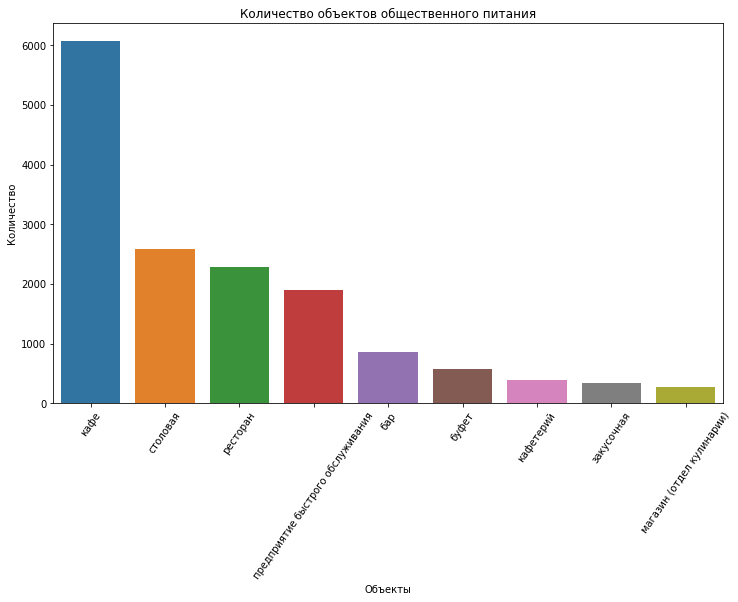

In [16]:
plt.figure(figsize=(12, 7))
sns.barplot(data=df_object_type, x='object_type', y='count')
plt.title('Количество объектов общественного питания')
plt.xlabel('Объекты')
plt.ylabel('Количество')
plt.xticks(rotation = 55)
plt.show()

Видим, что наиболее популярным заведением общественного питания в Москве являются кафе, их более 6000 шт. (почти 40% от общего числа). Далее с большим отрывом мдут: столовая 2584 шт (17%), ресторан 2282 шт (15%). Наименее популярны закусочные 348 шт (менее 2,3%) и отделы кулинарии 273 шт (1,8%).

## Соотношение сетевых и несетевых заведений по количеству

In [17]:
df_chain = df.groupby('chain')['id'].agg(['count']).reset_index()
#df_chain = df_chain.rename(columns={'id':'count'})
df_chain['ratio'] = ((df_chain['count']/df_chain['count'].sum())*100).round(2)
df_chain['chain'] = df_chain['chain'].str.replace('да', 'сеть')
df_chain['chain'] = df_chain['chain'].str.replace('нет', 'не сеть')
display(df_chain)

,chain,count,ratio
0,сеть,3064,20.05
1,не сеть,12217,79.95


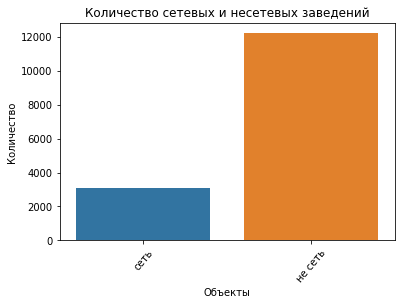

In [18]:
sns.barplot(data=df_chain, x='chain', y='count')
plt.title('Количество сетевых и несетевых заведений')
plt.xlabel('Объекты')
plt.ylabel('Количество')
plt.xticks(rotation = 50)
plt.show()

Таким образом, несетевых заведений общественного питания в Москве намного больше, чем сетевых. Количество заведений, входящих в сеть всего 3064 шт (20%), в то время как несетевых 12217 шт. (80%). Теперь посмотрим, для какого вида объекта общественного питания характерно сетевое распространение. 

In [19]:
df_object_chain = df.groupby(['object_type', 'chain'])['id'].agg(['count']).reset_index()
df_object_chain['chain'] = df_object_chain['chain'].str.replace('да', 'сеть')
df_object_chain['chain'] = df_object_chain['chain'].str.replace('нет', 'не сеть')

display(df_object_chain)

,object_type,chain,count
0,бар,сеть,42
1,бар,не сеть,813
2,буфет,сеть,12
3,буфет,не сеть,564
4,закусочная,сеть,56
5,закусочная,не сеть,292
6,кафе,сеть,1458
7,кафе,не сеть,4613
8,кафетерий,сеть,55
9,кафетерий,не сеть,340


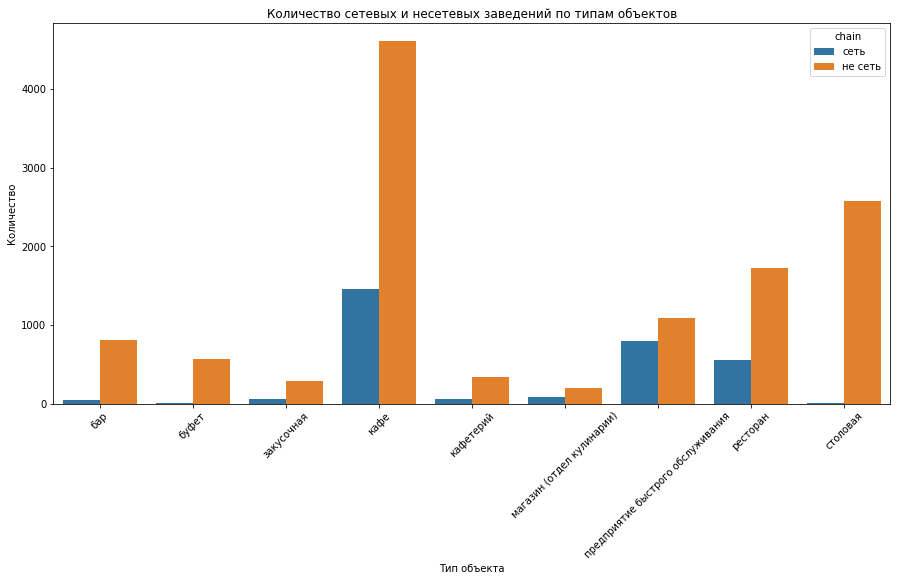

In [20]:
plt.figure(figsize=(15, 7))
sns.barplot(data=df_object_chain, x='object_type', y='count', hue='chain')
plt.title('Количество сетевых и несетевых заведений по типам объектов')
plt.xlabel('Тип объекта')
plt.ylabel('Количество')
plt.xticks(rotation = 45)

plt.show()

Таким образом, во всех типах предприятий общественного питания в Москве преобладает несетевое распространение. наименьший разрыв между сетевым и несетевым типом наблюдается у предприятий быстрого обслуживания. Теперь посчитаем долю сетевых заведений в общем количестве каждого типа заведения.

In [21]:
df_chain_ratio = df_object_chain.merge(df_object_type, on='object_type', how='left')
df_chain_ratio = df_chain_ratio.query('chain == "сеть"')
df_chain_ratio = df_chain_ratio.rename(columns={'object_type':'тип заведения', 'chain':'сеть', 'count_x':'кол-во сетевых', 'count_y':'кол-во несетевых'})
df_chain_ratio = df_chain_ratio[['тип заведения', 'сеть', 'кол-во сетевых', 'кол-во несетевых']]
df_chain_ratio['доля сетевых'] = (df_chain_ratio['кол-во сетевых']/df_chain_ratio['кол-во несетевых']).round(2)
df_chain_ratio = df_chain_ratio.sort_values(by='доля сетевых', ascending=False)
df_chain_ratio 


,тип заведения,сеть,кол-во сетевых,кол-во несетевых,доля сетевых
12,предприятие быстрого обслуживания,сеть,803,1897,0.42
10,магазин (отдел кулинарии),сеть,78,273,0.29
6,кафе,сеть,1458,6071,0.24
14,ресторан,сеть,557,2282,0.24
4,закусочная,сеть,56,348,0.16
8,кафетерий,сеть,55,395,0.14
0,бар,сеть,42,855,0.05
2,буфет,сеть,12,576,0.02
16,столовая,сеть,3,2584,0.00


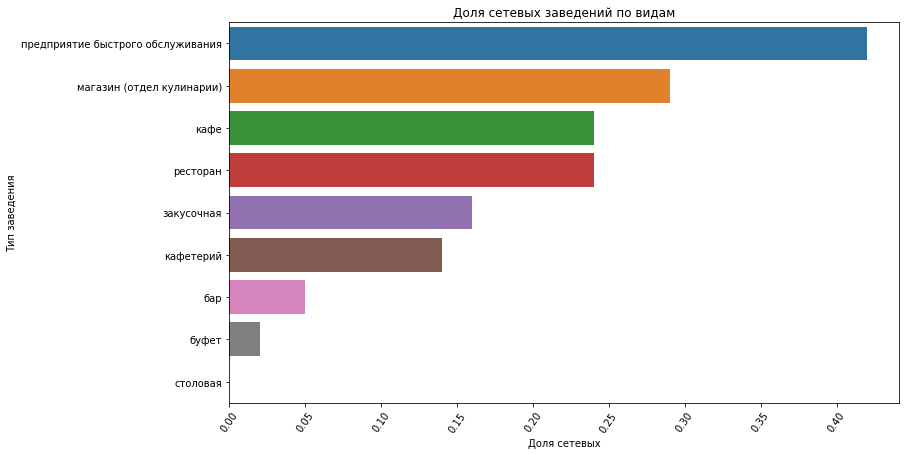

In [22]:
#построим график
plt.figure(figsize=(12, 7))
sns.barplot(data=df_chain_ratio, x='доля сетевых', y='тип заведения')
plt.title('Доля сетевых заведений по видам')
plt.xlabel('Доля сетевых')
plt.ylabel('Тип заведения')
plt.xticks(rotation = 55)
plt.show()

Из графика видно, что наибольшая доля сетевых заведений у предприятий быстрого обслуживания (более 40%), практически нет сетевых заведений у столовых.

## Характеристика сетевых заведений по посадочным местам

Для того, чтобы ответить на вопрос, что характерно для сетевых заведений: много заведений с небольшим числом посадочных мест в каждом или мало заведений с большим количеством посадочных мест, построим scatterplot, где по x - посадочные места, по y - количество заведений. Мысленно разделим график на 4 части и посмотрим, где больше всего скопление. Или меньше.


In [23]:
chain_seats = df[df['chain'] == "да"].groupby('object_name').agg({'id':'count', 'number':'median'})
chain_seats = chain_seats.sort_values(by='id', ascending=False)
chain_seats = chain_seats.rename(columns={'id':'количество заведений', 'number':'количество мест'})
display(chain_seats.head(5))

,количество заведений,количество мест
object_name,,
кфс,185,50.0
шоколадница,184,50.0
макдоналдс,170,76.0
бургер кинг,161,45.0
теремок,107,24.0


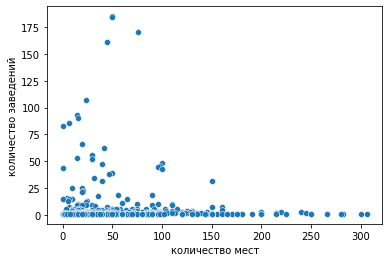

In [24]:
sns.scatterplot(data=chain_seats, y='количество заведений', x='количество мест')
    
plt.show()

Таким образом, из графика видно, что наиболее распространенная ситуация - мало заведений (10-15) с большим количеством посадочных мест. Проверим эту теорию на цифрах.

In [25]:
def cafe_seat(row):
    cafe = row['количество заведений']
    seat = row['количество мест']
    if cafe <= 6 and seat <= 50:
        return 'мало заведений мало мест'
    if cafe > 6 and seat <= 50:
        return 'много заведений мало мест'
    if 0 < cafe <= 6 and seat > 50:
        return 'мало заведений много мест'
    if cafe > 6 and seat > 50:
        return 'много заведений много мест'
chain_seats['cafe_new_category'] =chain_seats.apply(cafe_seat, axis=1)

print(chain_seats['cafe_new_category'].value_counts())    



мало заведений мало мест      243
мало заведений много мест     184
много заведений мало мест      41
много заведений много мест     17
Name: cafe_new_category, dtype: int64


Получили следующую картину: преобладают сети с малым количеством заведений и малым количеством мест, самые редкие - сети с большим количеством заведений и с большим средним количеством мест. 

## Среднее количество посадочных мест по типам объектов

Сначала построим boxplot и посмотрим на выбросы. Для ответа на вопрос, какой вид предоставляет в среднем самое большое количество посадочных мест, сделаем группировку по объектам и среднему количеству посадочных мест. А потом построим barplot

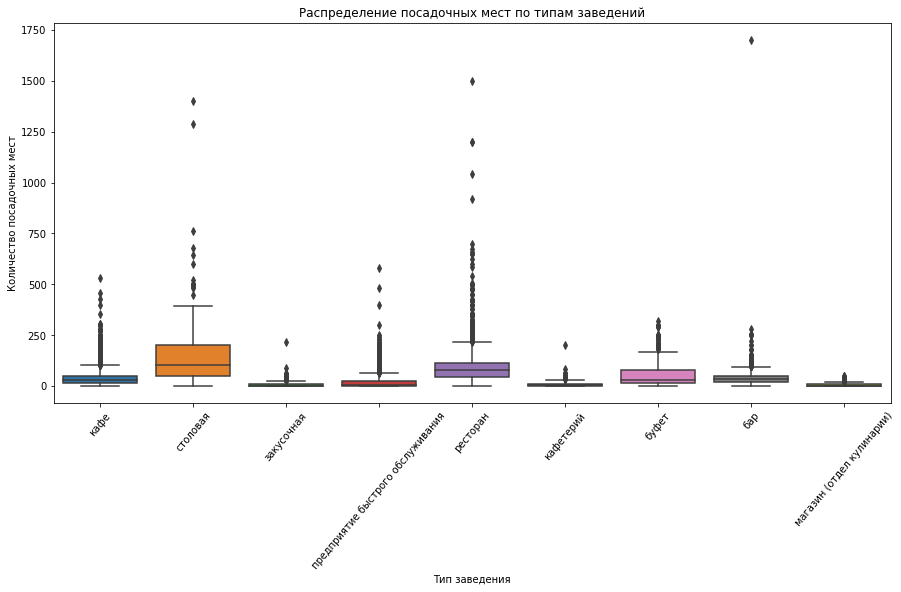

In [26]:
plt.figure(figsize=(15, 7))
sns.boxplot(data=df, x='object_type', y='number')
plt.title('Распределение посадочных мест по типам заведений')
plt.xlabel('Тип заведения')
plt.ylabel('Количество посадочных мест')
plt.xticks(rotation = 50)
plt.show()

Таким образом ,среднее количество посадочных мест больше всего у столовых (около 100) и ресторанов (чуть менее 100). Но в этих двух типах заведений и больше всего выбросов. Поэтому для уточнения картины посмотрим на медианные значения

In [27]:
object_type_number = df.groupby('object_type')['number'].agg(['median']).reset_index()
object_type_number = object_type_number.sort_values(by='median', ascending=False)
object_type_number

,object_type,median
8,столовая,103
7,ресторан,80
0,бар,35
1,буфет,32
3,кафе,30
4,кафетерий,6
6,предприятие быстрого обслуживания,6
2,закусочная,0
5,магазин (отдел кулинарии),0


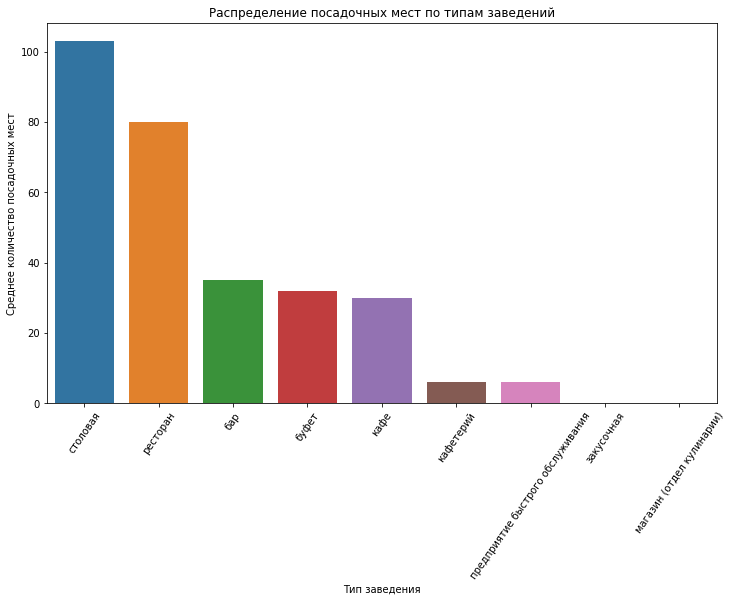

In [28]:
plt.figure(figsize=(12, 7))
sns.barplot(data=object_type_number, x='object_type', y='median')
plt.title('Распределение посадочных мест по типам заведений')
plt.xlabel('Тип заведения')
plt.ylabel('Среднее количество посадочных мест')
plt.xticks(rotation = 55)
plt.show()


Общая картина не изменилась, наибольшее среднее количество мест в столовых (чуть более 100), далее идут рестораны (80). Практически отсутствуют - в отделах кулинарии и закусочных.

## ТОП-10 улиц по количеству объектов

Для выполнения этой задачи сначала выделим улицы в отдельный столбец

In [29]:
#разорвем адрес
df[['city', 'street', 'house']] = df['address'].str.split(',', n=2, expand=True)
df


,id,object_name,chain,object_type,address,number,city,street,house
0,151635,сметана,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48,город Москва,улица Егора Абакумова,дом 9
1,77874,родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35,город Москва,улица Талалихина,"дом 2/1, корпус 1"
2,24309,кафе «академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95,город Москва,Абельмановская улица,дом 6
3,21894,пиццетория,да,кафе,"город Москва, Абрамцевская улица, дом 1",40,город Москва,Абрамцевская улица,дом 1
4,119365,кафе «вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50,город Москва,Абрамцевская улица,"дом 9, корпус 1"
5,27429,стол. при гоу сош № 1051,нет,столовая,"город Москва, Абрамцевская улица, дом 15, корп...",240,город Москва,Абрамцевская улица,"дом 15, корпус 1"
6,148815,брусника,да,кафе,"город Москва, переулок Сивцев Вражек, дом 6/2",10,город Москва,переулок Сивцев Вражек,дом 6/2
7,20957,буфет мтуси,нет,столовая,"город Москва, Авиамоторная улица, дом 8, строе...",90,город Москва,Авиамоторная улица,"дом 8, строение 1"
8,20958,кпф семья-1,нет,столовая,"город Москва, Авиамоторная улица, дом 8, строе...",150,город Москва,Авиамоторная улица,"дом 8, строение 1"
9,28858,столовая мтуси,нет,столовая,"город Москва, Авиамоторная улица, дом 8, строе...",120,город Москва,Авиамоторная улица,"дом 8, строение 1"


Теперь найдем топ-10 улиц по количеству объектов общественного питания и построим график

In [30]:
df_street = df[['id', 'street']]
df_street = df_street.rename(columns={'street':'улица'})
display(df_street.head(5))

,id,улица
0,151635,улица Егора Абакумова
1,77874,улица Талалихина
2,24309,Абельмановская улица
3,21894,Абрамцевская улица
4,119365,Абрамцевская улица


In [31]:
df_street['улица'].value_counts()

 город Зеленоград                                  232
 проспект Мира                                     203
 Профсоюзная улица                                 181
 Ленинградский проспект                            170
 Пресненская набережная                            167
 Варшавское шоссе                                  161
 Ленинский проспект                                147
 поселение Сосенское                               137
 проспект Вернадского                              128
 Кутузовский проспект                              114
 Каширское шоссе                                   111
 Кировоградская улица                              108
 Ходынский бульвар                                 102
 Ленинградское шоссе                               100
 Дмитровское шоссе                                 100
 улица Новый Арбат                                  92
 улица Ленинская Слобода                            85
 Алтуфьевское шоссе                                 81
 Пятницкая

In [32]:
#уберем из улиц город Зеленоград и Сосенское поселение
df_street['улица'] = df_street['улица'].str.strip()
df_street = df_street.query('улица not in ["город Зеленоград", "поселение Сосенское"]')

In [33]:
df_street_10 = df_street.groupby('улица')['id'].agg(['count']).reset_index()
df_street_10 = df_street_10.sort_values(by='count', ascending=False)
df_street_10 = df_street_10.head(10)
df_street_10

,улица,count
1450,проспект Мира,203
993,Профсоюзная улица,181
683,Ленинградский проспект,170
979,Пресненская набережная,167
407,Варшавское шоссе,161
686,Ленинский проспект,147
1447,проспект Вернадского,128
674,Кутузовский проспект,114
600,Каширское шоссе,111
605,Кировоградская улица,108



Все, Зеленоград и Сосенское ушли. Убираем их из анализа, т.к. это отдельные муниципальные образования со своими улицами. Поэтому мы не можем их принять к анализу аналогично отдельным улицам


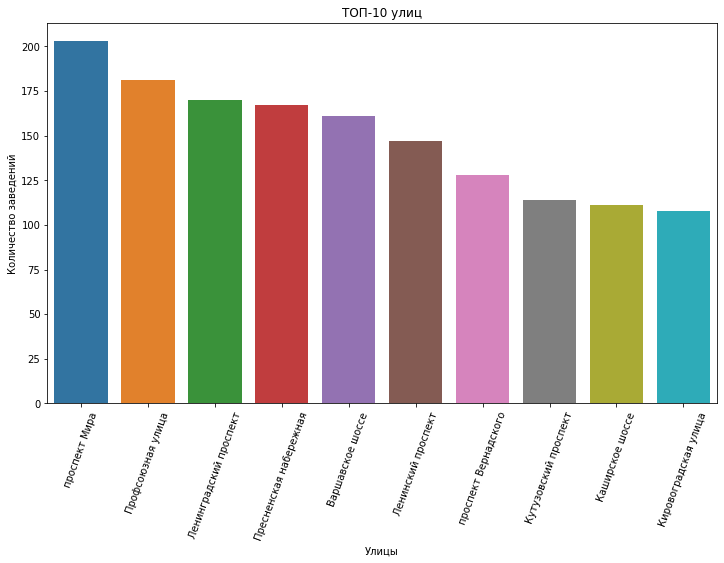

In [34]:
#построим график
plt.figure(figsize=(12, 7))
sns.barplot(data=df_street_10, x='улица', y='count')
plt.title('ТОП-10 улиц')
plt.xlabel('Улицы')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 70)
plt.show()


Самое время найти улицы Москвы, где всего по одному заведению. 

## Улицы с одним объектом общепита

In [35]:
df_street_1 = df_street.groupby('улица')['id'].agg(['count']).reset_index()
df_street_1 = df_street_1.query('count == 1')
display(len(df_street_1))
display(df_street_1)

579

,улица,count
2,1-й Балтийский переулок,1
3,1-й Басманный переулок,1
4,1-й Ботанический проезд,1
7,1-й Вешняковский проезд,1
9,1-й Голутвинский переулок,1
13,1-й Зачатьевский переулок,1
15,1-й Кирпичный переулок,1
16,1-й Кожевнический переулок,1
17,1-й Кожуховский проезд,1
18,1-й Коптельский переулок,1


Таким образом, улиц, где всего одно заведение, 579 шт., так что выбор для открытия довольно большой. 

## Общий вывод и рекомендации

Выводы:
- Самый популярный вид заведения общественного питания в Москве - кафе, как раз его мы и будем открывать. 
- Наибольшее количество кафе в Москве - не сетевые, поэтому нет никакого риска открыть пока одно кафе. 
- Что касается количества посадочных мест - наиболее оптимальным будет 30-35.
- Самый главный вопрос - месторасположение. Улицы, где расположен один объект, скорее всего - не вариант. Скорее всего, это переулки, куда мало кто заглядывает. Улицы с большим количеством объектов - это большие улицы, где проходимость высокая (Ленинградский проспект, Ленинский проспект, проспекты Мира и Вернадского, Варшавское шоссе и Профсоюзная улица). Золотое правило открытия бизнеса гласит: "Открывайся там, где открыты твои конкуренты", это место как правило уже нахоженное, часть трафика конкурента определенно перетечет к нам.


Рекоментации:
Открываем кафе на 30-35 посадочных мест. Расположение - улицы с высокой проходимостью. На первом этапе развития роботы должны сделать свое дело - привлечь посетителей, а дальше необходимо работать с качеством. После того, как кафе уже будет известно в городе, можно будет открывать еще точки в других районах Москвы. Но это потом. 


Презентация: https://cloud.mail.ru/public/oKJD/39pTJNbA9